# Neural Style-Transfer

## Justification
While many computer vision applications have had impressive development over the past decade, neural style transfer is an example of conceptually simple, qualitatively valuable, and thoroughly enjoyable task that has not been covered in the Deep Learning standard curriculum.

Personally, the ability to apply Mondrian's style of lines and colored squares to photographs and obtain something intelligible and, dare I say it, pretty, is one of the most fun deep learning applications I have come across.

## Methodology
The methodology applied follows that introduced in Gatys, Ecker, & Bethge (2015). Taken as the seminal work in style transfer, the 2015 method can be applied for high-quality qualitative results and runs relatively quickly (in about 2 minutes for a 512x512 image, for 100 steps) on a local CPU.

The code used in this notebook builds on the PyTorch tutorial by Jacq (2021). All comments on the code are mine, but the code itself is mostly not.

### Overview
The method in Gatys et al (2015) takes one content image, one style image, and one input image which it modifies until it obtains an output image that contains the content of the first and the style of the second (the style and content images are henceforth called "source images" or "sources"). To do so, a loss function is defined with terms for a content loss function and for a style loss function. Those define the "distance" between the input image and the sources.

To compute those losses, we use a pre-trained convolutional neural network to obtain the feature maps of each of the three images. As in Gatys et al (2015) and Jacq (2021), I use pre-trained convolutional layers from the 19-layer VGG network.

The steps needed to obtain the output image, which mixes the style and content of their respective sources, are:
1. Extract pre-trained model layers to be used, adding style and content loss modules depending on the layers chosen to be used as content and style layers
2. Freeze model weights and allow input image tensor to be updated in backpropagation
3. For each step in optimization, compute loss by adding style and content losses weighted by styule and content weights, which determine how much "importance" to attribute to each
4. From computed loss, perform optimizer step by changing input image

After performing the desired number of steps, the resulting image is returned and should reflect the content and style of the sources.


In [842]:
# Hyperparameter definitions

# Select style and content files
style_file = "vg-1.jpg"
content_file = "Apollo-11-Crew-Photo1.jpg"

# Define side of square image
imsize = 256

# Define style and content weights
style_w = 100000
content_w = 1
alpha_beta_ratio = content_w/style_w
print("Alpha/Beta:", alpha_beta_ratio)

# Set number of steps for training
n_steps = 100

# Choose whether to use Average-Pooling instead of Max-Pooling
use_avg_pool = True

Alpha/Beta: 1e-05


In [843]:
import torch
from torch import nn, optim
from torchvision import transforms, models

from datetime import datetime
import matplotlib.pyplot as plt
# import copy
from PIL import Image
from IPython.display import Image as IMG

# Seed for reproducibility
torch.manual_seed(2022)

In [844]:
# Define timestamp to save files
timestamp = datetime.now().strftime("%d_%b-%H_%M")

In [845]:
# Define device to use CUDA is available (e.g. when testing on Colab) or CPU locally, if needed
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

# Load pre-trained PyTorch VGG19 network
cnn = models.vgg19(pretrained = True).features.to(device).eval()

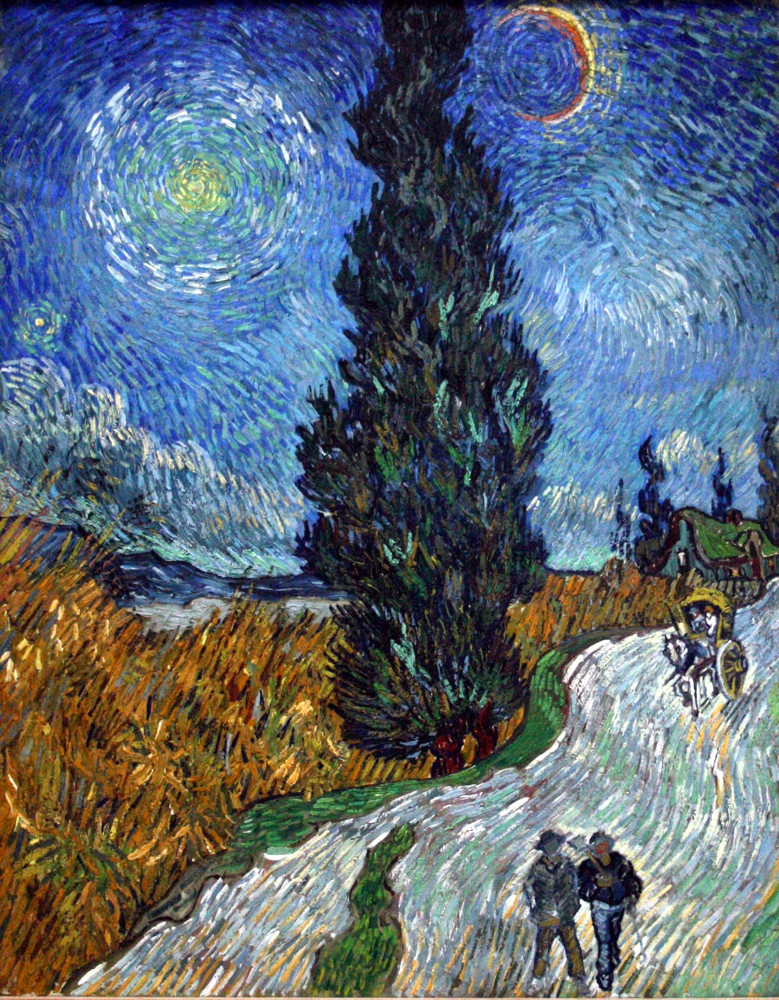

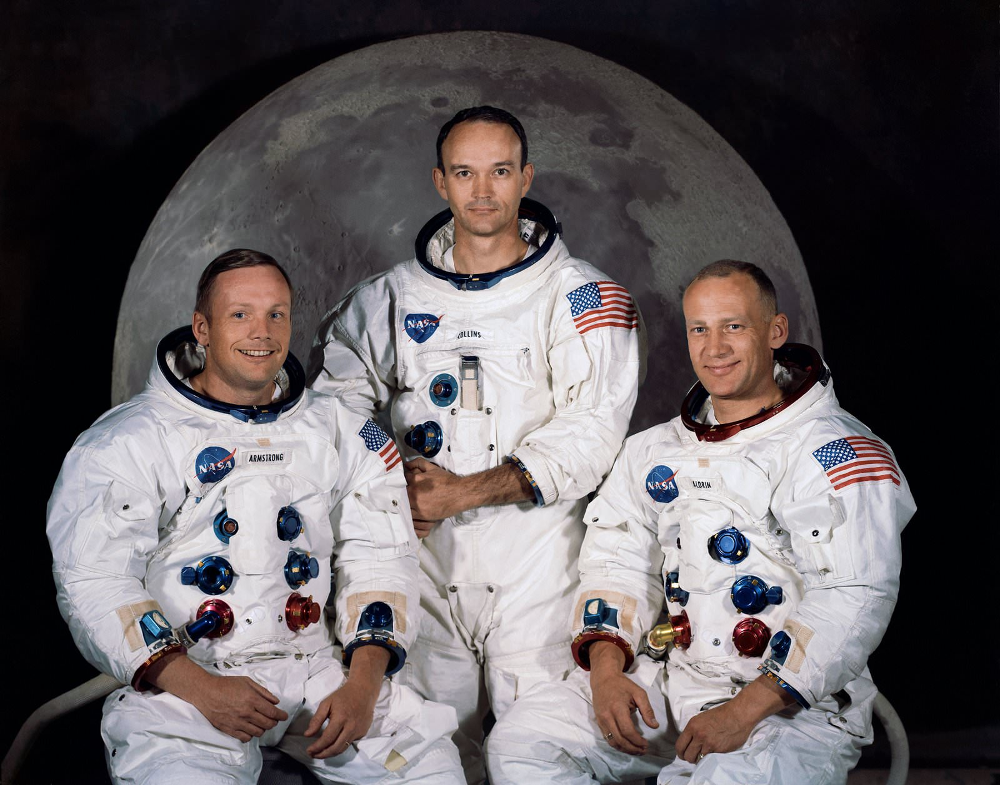

In [846]:
# Visualize style and content images
style_img = Image.open(style_file)
content_img = Image.open(content_file)
style_img.show()
content_img.show()

In [847]:
# Check for image sizes to not have smaller images than intended
assert(style_img.size[0] >= imsize and style_img.size[1] >= imsize)
assert(content_img.size[0] >= imsize and content_img.size[1] >= imsize)

# Create Compose object to apply transformations to files
# Images are resized into a square of side imsize, and PIL images are then converted into tensors
# The Resize transform applied to both sources also guarantees they have the same dimensions
loader = transforms.Compose([
    transforms.Resize((imsize, imsize)),
    transforms.ToTensor()
])

In [848]:
def image_loader(filename: str, resize_to_content: bool=False):
    """Applies the transformations in the Compose object to a file

    Args:
        filename (str): filename string as saved in your directory
        resize_to_content (bool, optional): _description_. Defaults to False.

    Returns:
        _type_: _description_
    """    
    image = Image.open(filename)
    # We load the image and use unsqueeze to to add a batch dimension, which is necessary for training
    # Refer to Symon Maszke's answer on https://stackoverflow.com/a/61598951
    image = loader(image).unsqueeze(0)
    # Move tensor to GPU/CPU
    return image.to(device, torch.float)

In [849]:
# Pass source images through loader to obtain tensors
content_image = image_loader(content_file)
style_image = image_loader(style_file, resize_to_content=True)

In [850]:
# Check that style and content tensors are the same size
print(style_image.size())
# print(content_image.size())
assert(style_image.size() == content_image.size())


torch.Size([1, 3, 256, 256])


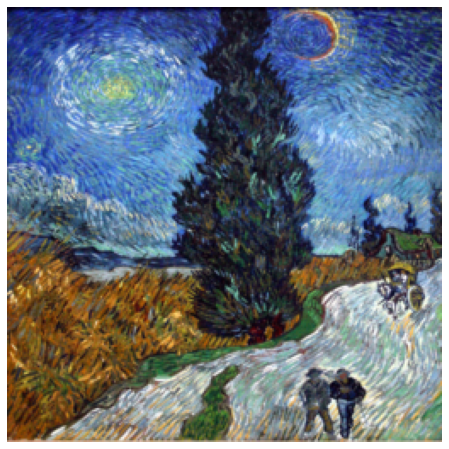

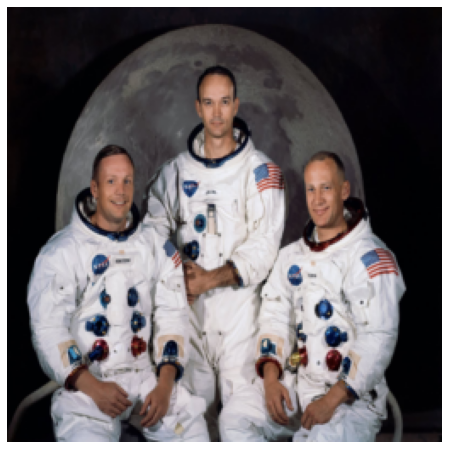

In [851]:
# Define unloader to obtain PIL images from tensors
unloader = transforms.ToPILImage()

def tensor2image(tensor):
    """Transforms torch Tensor into PIL image

    Args:
        tensor (torch.Tensor): image tensor as loaded using image_loader

    Returns:
        PIL.Image.Image: PIL image representation of tensor
    """    
    # Clone tensor to not modify it
    image = tensor.cpu().clone()
    # Remove first (batch) dimension from tensor as it doesn't represent image data and is thus "superficial"
    image = image.squeeze(0)
    # Transform tensor into PIL image
    image = unloader(image)
    return image

def display_img(image, save_img = False) -> None:
    """Display (and save) image obtained using tensor2image

    Args:
        image (PIL.Image.Image): PIL image representation of tensor
        save_img (bool, optional): Saves image to output directory using 
            style and content file names, as well as timestamp and image size. Defaults to False.
    """    
    plt.imshow(image)
    plt.axis("off")
    if save_img:
        plt.savefig("outputs/" + style_file[:-4] + "-" + content_file[:-4] + "-" + str(timestamp) + f"_{imsize}" + "_" + str(alpha_beta_ratio) + ".png",\
            dpi = 400, bbox_inches = "tight")
    plt.pause(0.001)

style_tensor = tensor2image(style_image)
display_img(style_tensor)
content_tensor = tensor2image(content_image)
display_img(content_tensor)

In [852]:
# Define custom loss and normalization modules for training NST
class ContentLoss(nn.Module):
    def __init__(self, target):
        super(ContentLoss, self).__init__()
        # .detach() is used to take target content out of gradient backpropagation tree
        self.target = target.detach()

    def forward(self, input):
        # Compute MSE loss between content and input tensors
        self.loss = nn.functional.mse_loss(input, self.target)
        return input

class StyleLoss(nn.Module):
    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        # Similarly to ContentLoss, .detach() removes the gram matrix content from
        # the backprop computation tree. The target is also defined to be the gram matrix of the 
        # the relevant style image feature.
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        # Computes the gram matrix of the input and computes the MSE between 
        # the target Gram matrix and the input's
        G = gram_matrix(input)
        self.loss = nn.functional.mse_loss(G, self.target)
        return input

class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        # .view() is used to make the mean and std tensors compatible with image tensors
        # The method just adds two superficial 1 dimensions so self.mean and self.std are Cx1x1
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, input):
        # Normalize input tensor by returning the distribution statistic
        return (input - self.mean) / self.std

In [853]:
def gram_matrix(input):
    """Computes the gram matrix used for style loss computation
    Gram matrices are computed for activation values in different layers for style
        and input images, and then used to compute style loss

    Args:
        input (torch.Tensor): input tensor that is either the input 
            or the style image's layer activation in tensor representation

    Returns:
        torch.Tensor: Normalized Gram matrix, which we use to compare the 
            input image's and the style image's and compute MSE loss
    """
    # Get input dimensions
    a, b, c, d = input.size()
    # Reshapes input tensor to 2 dimensions
    features = input.view(a*b, c*d)
    # Compute Gram matrix with matrix mult. between feature matrix and its transpose
    G = torch.mm(features, features.t())
    # Normalize values of the Gram matrix 
    return G.div(a*b*c*d)

In [854]:
# Define VGG channel-normalization means and standard deviations
# These can be found on https://github.com/pytorch/examples/blob/97304e232807082c2e7b54c597615dc0ad8f6173/imagenet/main.py#L197-L198
# There doesn't seem to be a better way of loading model-specific norm. means and stds, which is unfortunate
vgg19_norm_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
vgg19_norm_std = torch.tensor([0.229, 0.224, 0.225]).to(device)

In [855]:
content_layers_def = ['conv_4']
style_layers_def = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']

def get_style_model(cnn, normalization_mean, normalization_std, \
    style_image, content_image, content_layers = content_layers_def,\
    style_layers = style_layers_def, use_avg_pool = True):
    """Computes style and content losses, and returns model layers used in style transfer

    Args:
        cnn (torchvision.models.features): Pre-trained CNN whose layers are used for NST
        normalization_mean (_type_): Normalization mean as taken from VGG19 channel means
        normalization_std (_type_): Normalization STD as taken from VGG19 channel STDs
        content_image (torch.Tensor): Content image tensor
        content_layers (list, optional): Layer name strings used to extract content features. Defaults to content_layers_def.

    Raises:
        RuntimeError: If a layer used is an unrecognized object instance, it raises a RuntimeError

    Returns:
        torch.nn.Module: Model layers used for computing input image gradients
        list: Style losses for each style layer
        list: Content losses for each content layer
    """            
    # Normalize 
    normalization = Normalization(normalization_mean, normalization_std).to(device)

    content_ls = []
    style_ls = []

    model = nn.Sequential(normalization)

    i = 0
    for j, layer in cnn.named_children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = f"conv_{i}"
        elif isinstance(layer, nn.ReLU):
            name = f'relu_{i}'
            layer = nn.ReLU(inplace = False)
        elif isinstance(layer, nn.MaxPool2d):
            name = f"pool_{i}"
            # Below, I attempted replacing the max-pooling layers with average-pooling layers
            if use_avg_pool:
                cnn[int(j)] = nn.AvgPool2d(kernel_size=2, stride=2, padding=0)
                layer = cnn[int(j)]
        elif isinstance(layer, nn.BatchNorm2d):
            name = f"bn_{i}"
        else:
            raise RuntimeError(f"Unrecognized layer: {layer.__class__.__name__}")

        model.add_module(name, layer)

        # If layer is in the list of content layers being used, add content loss module, and store content loss value
        if name in content_layers:
            target = model(content_image).detach()
            content_l = ContentLoss(target)
            model.add_module(f"content_loss_{i}", content_l)
            content_ls.append(content_l)

        # Similarly, if a layer is used as a style layer, add style loss module to the model and store loss value
        if name in style_layers:
            target_feature = model(style_image).detach()
            style_l = StyleLoss(target_feature)
            model.add_module(f"style_loss_{i}", style_l)
            style_ls.append(style_l)

    # Iterate over the network layers to find the index of the last content or style loss module
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break
    
    # Trim model layers to capture the model only until the last content or style loss module
    model = model[:(i+1)]

    return model, style_ls, content_ls


In [856]:
# We define the input image as a mere clone of the content image, at first
# It is then modified at each step
input_image = content_image.clone()

In [857]:
# Gatys, the author of the original paper, suggests using L-BFGS (Jacq, 2021)
get_optim = lambda input_img: optim.LBFGS([input_img])

In [858]:
def run(cnn, norm_mean, norm_std, \
    content_image, style_image, input_image,\
    n_steps = 100, style_w = 100000, content_w = 1, use_avg_pool = use_avg_pool):
    """Trains neural style-transfer layers to generate output image

    Args:
        cnn (torchvision.models.features): Pre-trained CNN whose layers are used for NST
        norm_mean (torch.Tensor): Normalization mean as taken from VGG19 channel means
        norm_std (torch.Tensor): Normalization STD as taken from VGG19 channel STDs
        style_image (torch.Tensor): Style image tensor as loaded
        input_image (torch.Tensor): Input image tensor, in this case a clone of the content image
        style_w (int, optional): style weight for loss computation. Defaults to 100000.
        content_w (int, optional): content weight for loss computation. Defaults to 1.

    Returns:
        torch.Tensor: Output image, which is the final state of the 
    """    

    print("Model build step")

    # Obtain model layers, style image and content image losses for training
    model, style_ls, content_ls = get_style_model(cnn, norm_mean, norm_std,\
        style_image, content_image, use_avg_pool=use_avg_pool)

    # Freeze model weights and change only input image
    input_image.requires_grad_(True)
    model.requires_grad_(False)

    # Define optimizer to compute gradient steps
    optimizer = get_optim(input_image)

    print("Optimization step")
    step = [0]

    while step[0] <= n_steps:
        def closure():
            with torch.no_grad():
                input_image.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_image)
            style_score = 0
            content_score = 0

            for sl in style_ls:
                style_score += sl.loss
            for cl in content_ls:
                content_score += cl.loss

            style_score *= style_w
            content_score *= content_w

            loss = style_score + content_score
            loss.backward()

            step[0] += 1
            if step[0] % 25 == 0:
                print(f"Step {step}")
                print(f"Style loss: {style_score.item()}")
                print(f"Content loss: {content_score.item()}")

            return style_score + content_score

        while step[0] <= n_steps:
            optimizer.step(closure)

    with torch.no_grad():
        input_image.clamp_(0,1)

    return input_image


In [859]:
output = run(cnn, vgg19_norm_mean, vgg19_norm_std,\
    content_image, style_image, input_image, n_steps = n_steps,\
    style_w = style_w, content_w = content_w)

Model build step


/tmp/ipykernel_366/556653275.py:33: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.mean = torch.tensor(mean).view(-1, 1, 1)
/tmp/ipykernel_366/556653275.py:34: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.std = torch.tensor(std).view(-1, 1, 1)


Optimization step
Step [25]
Style loss: 1.4618585109710693
Content loss: 4.940347671508789
Step [50]
Style loss: 0.712274432182312
Content loss: 4.073111057281494
Step [75]
Style loss: 0.6598263382911682
Content loss: 3.8500173091888428
Step [100]
Style loss: 0.6542326807975769
Content loss: 3.757333755493164


Style in vg-1.jpg applied to content in Apollo-11-Crew-Photo1.jpg


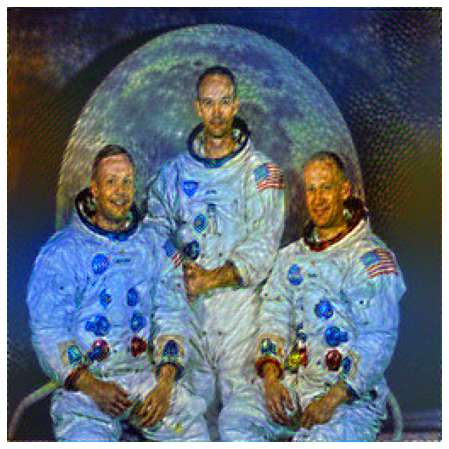

In [860]:
print(f"Style in {style_file} applied to content in {content_file}")
op_tensor = tensor2image(output)
display_img(op_tensor, save_img=True)

## Examples

### Unsuccessful
Some combinations did not produce noteworthy transfers at any scale with the original combination of weights for style and content. That was the case with applying Pollock's work to the Apollo 11 picture:

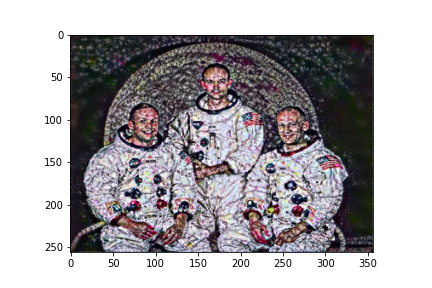

In [861]:
IMG("outputs/pollock1-Apollo-11-Crew-Photo1-19_Mar-15_39_256.png")

### Arguably successful
The question of whether style transfer was successfully performed depends on artistic rigidity and taste. As mentioned in the motivation behind this task, Mondrian's style applied to pictures yield surprisingly pleasant results, in my opinion.


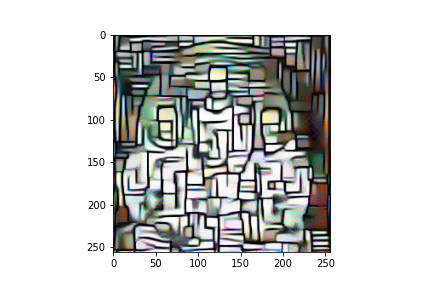

In [862]:
IMG("outputs/mondrian-Apollo-11-Crew-Photo1-19_Mar-15_31_256.png")

## Interpretation

### Strengths
- Bearably short training times for obtaining small volumes of images
- High-quality results from single pair of images are possible, if not guaranteed
- Changing the pooling layer for smoother results is easy and can lead to significantly different results

### Weaknesses and improvements
- Style transfer is highly content-dependent. From the use of the two Mondrian paintings, we can see how the preponderance of different colors in each painting influences not only the colors obtained in the output image, but also the shapes obtained. A shallow, but common-sense understanding of "style" would lead us to believe both Mondrian paintings have the same style, since they are both dependent on irregularly spaced parallel and orthogonal lines with colored squares. Thus, if both paintings have the same style, one could argue the difference between the output image for both cases should be small. One possible improvement would be to use both images in training; instead of a loss function that contained one term related to style loss, it could contain n, for each of n style images used. Gram matrices could also be "averaged" for the style images used, to obtain something that would be more representative of both images. It would stand to be observed whether that averaging would actually lead the picture to still follow the artist's style.
- Optimizers: L-BFGS was suggested by Gatys, but other optimizers should be tested to compare results. Naturally, with more computational resources, a less memory-constrained version of BFGS should be tried.
- Systematic grid search evaluation: Using just the qualitative comparisons performed here, we cannot easily and directly compare output images. With more time and resources, I would like to produce a grid of images for different hyperparameter values to compare outputs. Alternatively, I would try to implement the base E and base C statistics introduced in Yeh et al (2020) to put a number to the output's respect to style and image object decomposition, respectively. Because using those statistics, however, would require E- and C-test data, which is not readily available.
- Pooling layers: The pooling layers used were the Max2dPool layers present in VGG19, but as Gatys et al (2015) noted, replacing those layers by average pooling layers might improve the gradient flow and lead to "more appealing" results. That was attempted, but a more systematic evaluation is warranted. An example of the substitution can be seen below. Specifically using Mondrian as a style, having smoother images might not be better than otherwise since the style is defined by rigid objects. For a Van Gogh-style painting, however, it probably fits the content better.
- Another improvement would be to try using different input images, such as starting from the style. The weights of the style and content losses would be reversed, naturally, but an evaluation of the end output would illustrate whether it is "easier" to go from the style to the objects, or from the objects to the style. I believe the latter.

Text(0.5, 1.0, 'Average-Pooling layers used')

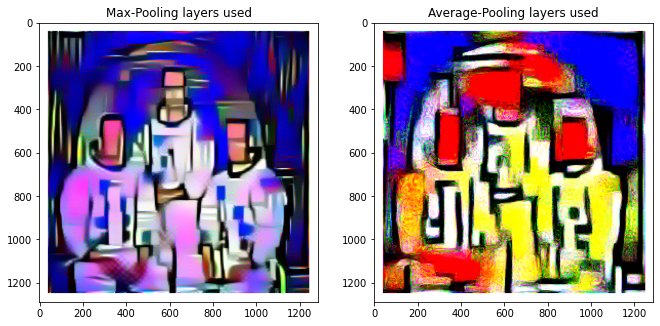

In [863]:
avg_pool = "outputs/mondrian-2-Apollo-11-Crew-Photo1-20_Mar-14_51_256_1e-05_AVGPOOL.png"
max_pool = "outputs/mondrian-2-Apollo-11-Crew-Photo1-20_Mar-13_51_256_1e-05_MAXPOOL.png"

# Plotting code from https://stackoverflow.com/a/50569248
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib import rcParams
%matplotlib inline

# Figure size, in inches
rcParams['figure.figsize'] = 11 ,8

# Read images
img_A = mpimg.imread(max_pool)
img_B = mpimg.imread(avg_pool)

# Display images
fig, ax = plt.subplots(1,2)
# Max-Pool image on the left, Avg-Pool image on the right
ax[0].imshow(img_A)
ax[0].set_title("Max-Pooling layers used")
ax[1].imshow(img_B)
ax[1].set_title("Average-Pooling layers used")

### Some other examples

In [864]:
from glob import glob
import ipyplot
# Read images
files = glob("outputs/*.png")
ipyplot.plot_images(files, max_images=30, img_width=256)

## References
Ganegedara, T. (2019). Intuitive guide to neural style transfer. Retrieved from https://towardsdatascience.com/light-on-math-machine-learning-intuitive-guide-to-neural-style-transfer-ef88e46697ee <br>

Gatys, L. A., Ecker, A. S., & Bethge, M. (2015). A neural algorithm of artistic style. arXiv preprint arXiv:1508.06576. <br>

Jacq, A. (2021). Neural transfer using PyTorch. Retrieved from https://pytorch.org/tutorials/advanced/neural_style_tutorial.html <br>

Maszke, S. (2020). Pytorch squeeze and unsqueeze. Retrieved from https://stackoverflow.com/a/61598951 <br>

Yeh, M. C., Tang, S., Bhattad, A., Zou, C., & Forsyth, D. (2020). Improving style transfer with calibrated metrics. In Proceedings of the IEEE/CVF Winter Conference on Applications of Computer Vision (pp. 3160-3168). <br>